In [2]:
import os
import json

In [3]:
import matplotlib.pyplot as plt
import pandas as pd

In [4]:
from ax.service.ax_client import AxClient, ObjectiveProperties
from ax.modelbridge.generation_strategy import GenerationStep, GenerationStrategy
from ax.modelbridge.cross_validation import cross_validate
from ax.plot.diagnostic import interact_cross_validation
from ax.plot.pareto_frontier import plot_pareto_frontier
from ax.plot.pareto_utils import compute_posterior_pareto_frontier
from ax.plot.contour import interact_contour
from ax.modelbridge.registry import Models
from ax.modelbridge.modelbridge_utils import observed_hypervolume
from ax.utils.notebook.plotting import init_notebook_plotting, render
init_notebook_plotting()

[INFO 07-26 09:40:03] ax.utils.notebook.plotting: Injecting Plotly library into cell. Do not overwrite or delete cell.
[INFO 07-26 09:40:03] ax.utils.notebook.plotting: Please see
    (https://ax.dev/tutorials/visualizations.html#Fix-for-plots-that-are-not-rendering)
    if visualizations are not rendering.


In [5]:
so_folder = r'C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\examples\dev_example_surrogate_soo'
mo_folder = r'C:\Users\hannag01\Documents\wsm-calibration\src\parallel_optimiser\examples\dev_example_surrogate_moo'

In [6]:
so_client = AxClient.load_from_json_file(os.path.join(so_folder, 'history.json'))
mo_client = AxClient.load_from_json_file(os.path.join(mo_folder, 'history.json'))
so_client.fit_model()
mo_client.fit_model()

[INFO 07-26 09:40:05] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 07-26 09:40:05] ax.service.ax_client: Starting optimization with verbose logging. To disable logging, set the `verbose_logging` argument to `False`. Note that float values in the logs are rounded to 6 decimal points.
[INFO 07-26 09:40:05] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 07-26 09:40:09] ax.service.ax_client: Successfully instantiated a model for the first time.
[INFO 07-26 09:40:09] ax.service.ax_client: get_model_predictions() has been called when no model is instantiated. Attempting to instantiate the model for the first time.
[INFO 07-26 09:40:19] ax.service.ax_client: Successfully instantiated a model for the first time.


In [7]:
cv_results = cross_validate(so_client.generation_strategy.model)
render(interact_cross_validation(cv_results))

In [8]:
cv_results = cross_validate(mo_client.generation_strategy.model)
render(interact_cross_validation(cv_results))

In [9]:
render(interact_contour(model=so_client.generation_strategy.model, metric_name="emergency"))

In [10]:
render(interact_contour(model=so_client.generation_strategy.model, metric_name="delays"))

In [11]:
so_experiment_copy = so_client.experiment.clone_with(optimization_config=mo_client.experiment.optimization_config)

In [12]:
so_dummy_model = Models.BOTORCH_MODULAR(
    experiment=so_experiment_copy,
    data=so_experiment_copy.fetch_data(),
)

In [13]:
frontier = compute_posterior_pareto_frontier(
    experiment=mo_client.experiment,
    data=mo_client.experiment.fetch_data(),
    primary_objective=mo_client.experiment.metrics['emergency_from_actual'],
    secondary_objective=mo_client.experiment.metrics['delays_from_actual'],
    absolute_metrics=list(mo_client.experiment.metrics.keys()),
    num_points=20,
)

render(plot_pareto_frontier(frontier, CI_level=0.90))

In [14]:
frontier = compute_posterior_pareto_frontier(
    experiment=so_experiment_copy,
    data=so_experiment_copy.fetch_data(),
    primary_objective=so_experiment_copy.metrics['emergency_from_actual'],
    secondary_objective=so_experiment_copy.metrics['delays_from_actual'],
    absolute_metrics=list(so_experiment_copy.metrics.keys()),
    num_points=20,
)

render(plot_pareto_frontier(frontier, CI_level=0.90))

In [15]:
def retrospective_hypervolume_trace(so_experiment_copy, client_m, n):
    hvs = []

    
    for t in range(n):
        experiment = so_experiment_copy.clone_with(trial_indices=[i for i in range(t+1)])
        dummy_model = Models.BOTORCH_MODULAR(
            experiment=experiment,
            data=experiment.fetch_data(),
        )
        try:
            hv = observed_hypervolume(modelbridge=dummy_model)
        except:
            hv = 0
            print("Failed to compute hv")
        hvs.append(hv)
        print(f"Iteration: {t}, HV: {hv}")
    return hvs

In [16]:
so_hvs = retrospective_hypervolume_trace(so_experiment_copy, mo_client, len(so_client.get_trials_data_frame()))

[WARNING 07-26 09:42:43] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


[INFO 07-26 09:42:43] ax.modelbridge.transforms.standardize_y: Outcome emergency is constant, within tolerance.
[INFO 07-26 09:42:43] ax.modelbridge.transforms.standardize_y: Outcome emergency_from_actual is constant, within tolerance.
[INFO 07-26 09:42:43] ax.modelbridge.transforms.standardize_y: Outcome delays is constant, within tolerance.
[INFO 07-26 09:42:43] ax.modelbridge.transforms.standardize_y: Outcome delays_from_actual is constant, within tolerance.
c:\Users\hannag01\Documents\parallel-bayesopt-experiments\venv\lib\site-packages\botorch\models\utils\assorted.py:194: UserWarning:

std(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at ..\aten\src\ATen\native\ReduceOps.cpp:1807.)



Iteration: 0, HV: 0.0
Iteration: 1, HV: 0.0
Iteration: 2, HV: 0.0
Iteration: 3, HV: 0.0
Iteration: 4, HV: 0.0
Iteration: 5, HV: 0.0
Iteration: 6, HV: 0.0
Iteration: 7, HV: 0.0
Iteration: 8, HV: 0.0018014056006240165
Iteration: 9, HV: 0.0018014056006240165
Iteration: 10, HV: 0.0018014056006240165
Iteration: 11, HV: 0.0018014056006240165
Iteration: 12, HV: 0.0018014056006240165
Iteration: 13, HV: 0.0018033915794345165
Iteration: 14, HV: 0.0018033915794345165
Iteration: 15, HV: 0.0018033915794345165
Iteration: 16, HV: 0.0018033915794345165
Iteration: 17, HV: 0.0018033915794345165
Iteration: 18, HV: 0.0018033915794345165
Iteration: 19, HV: 0.0018033915794345165
Iteration: 20, HV: 0.0018033915794345165
Iteration: 21, HV: 0.0018033915794345165
Iteration: 22, HV: 0.0018033915794345165
Iteration: 23, HV: 0.0018033915794345165
Iteration: 24, HV: 0.0018033915794345165
Iteration: 25, HV: 0.0018033915794345165
Iteration: 26, HV: 0.0018033915794345165
Iteration: 27, HV: 0.0018033915794345165
Iterat

In [17]:
with open(os.path.join(mo_folder, 'best_points.json'), 'r', encoding='utf-8') as stream:
    mo_bestpoints = json.load(stream)

In [18]:
mo_hvs = []
for k in mo_bestpoints.keys():
    mo_hvs.append(mo_bestpoints[k]['hv'])

[WARNING 07-26 09:44:42] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.
[WARNING 07-26 09:44:42] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


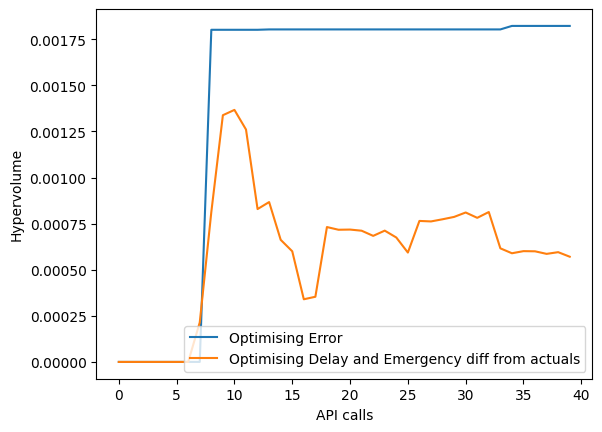

In [19]:
fig, ax = plt.subplots()

ax.plot(so_client.get_trials_data_frame()['trial_index'], so_hvs, label='Optimising Error')
ax.plot(mo_client.get_trials_data_frame()['trial_index'], mo_hvs, label='Optimising Delay and Emergency diff from actuals')

plt.xlabel("API calls")
plt.ylabel("Hypervolume")
plt.legend()

plt.show()

In [20]:
mo_client.get_hypervolume()

0.0005711193531953645

In [22]:
mo_pareto = mo_client.get_pareto_optimal_parameters()

In [46]:
s_best = so_client.get_best_trial()

[WARNING 07-26 10:06:00] ax.modelbridge.cross_validation: Metrics delays , delays_from_actual were unable to be reliably fit.


In [50]:
pd.json_normalize(s_best[1])

,dd-los,gw-non-covid-los,syswatch-scale
0,74.952099,5.0,1.0


In [55]:
mo_pareto[32][0]

{'dd-los': 77.83110561578724,
 'gw-non-covid-los': 5.0,
 'syswatch-scale': 0.8597506671556294}

In [58]:
mo_pareto[32][1][0]

{'delays': 101.76940393177247,
 'delays_from_actual': 0.029398704085844725,
 'emergency': 390.0082911548007,
 'emergency_from_actual': 0.023432279015506326,
 'error': 4.8206772273152865}

In [60]:
mo_pareto[18][1][0]

{'delays': 101.9488944568431,
 'delays_from_actual': 0.031155120129275432,
 'emergency': 388.67158595125045,
 'emergency_from_actual': 0.0221698739700884,
 'error': 3.412890754369613}

In [44]:
mo_bestpoints['40']['pareto_optimal']['32']

[{'dd-los': 77.83110561578724,
  'gw-non-covid-los': 5.0,
  'syswatch-scale': 0.8597506671556294},
 [{'delays': 101.767851152675,
   'delays_from_actual': 0.029400812631112418,
   'emergency': 390.01225927471444,
   'emergency_from_actual': 0.023429835246219777,
   'error': 4.822216481972333},
  {'delays': {'delays': 1.3677652426404223,
    'delays_from_actual': 0.0,
    'emergency': 0.0,
    'emergency_from_actual': 0.0,
    'error': 0.0},
   'delays_from_actual': {'delays': 0.0,
    'delays_from_actual': 6.969720836783921e-05,
    'emergency': 0.0,
    'emergency_from_actual': 0.0,
    'error': 0.0},
   'emergency': {'delays': 0.0,
    'delays_from_actual': 0.0,
    'emergency': 1.1632832850238715,
    'emergency_from_actual': 0.0,
    'error': 0.0},
   'emergency_from_actual': {'delays': 0.0,
    'delays_from_actual': 0.0,
    'emergency': 0.0,
    'emergency_from_actual': 6.760360288596943e-06,
    'error': 0.0},
   'error': {'delays': 0.0,
    'delays_from_actual': 0.0,
    'emerg

In [43]:
mo_client.get_trials_data_frame()

[WARNING 07-26 10:03:06] ax.service.utils.report_utils: Column reason missing for all trials. Not appending column.


,trial_index,arm_name,trial_status,generation_method,is_feasible,delays,delays_from_actual,emergency,emergency_from_actual,error,dd-los,gw-non-covid-los,syswatch-scale
0,0,0_0,COMPLETED,Sobol,False,71.425254,0.313219,495.484960,0.300485,678.230899,51.718531,6.741084,0.902096
1,1,1_0,COMPLETED,Sobol,False,105.886010,0.018135,536.622087,0.408457,601.797330,74.620438,7.493868,0.798608
2,2,2_0,COMPLETED,Sobol,False,72.400167,0.303845,536.999188,0.409447,935.885160,53.306091,7.629509,0.825414
3,3,3_0,COMPLETED,Sobol,False,65.389978,0.371250,562.040603,0.475172,1309.015173,52.490526,7.925574,0.973942
4,4,4_0,COMPLETED,Sobol,False,93.016861,0.105607,433.496238,0.137785,108.495643,65.518015,5.653080,0.991150
5,5,5_0,COMPLETED,Sobol,False,97.439735,0.063079,482.140003,0.265459,268.011624,79.353348,6.468253,0.933786
6,6,6_0,COMPLETED,BoTorch,False,98.628720,0.051647,411.816633,0.080884,33.154393,76.312462,5.445744,0.901697
7,7,7_0,COMPLETED,BoTorch,True,101.780190,0.021344,395.551069,0.038192,6.891092,79.358822,5.082479,0.990778
8,8,8_0,COMPLETED,BoTorch,True,106.204173,0.021194,388.690151,0.020184,3.083700,80.000000,5.000000,0.942753
9,9,9_0,COMPLETED,BoTorch,True,104.079592,0.000765,390.359467,0.024566,2.174584,73.379565,5.000000,0.767313


In [64]:
from ax.plot.pareto_frontier import scatter_plot_with_hypervolume_trace_plotly

In [68]:
trace_data = scatter_plot_with_hypervolume_trace_plotly(mo_client.experiment)

In [70]:
from ax.service.utils.best_point_mixin import BestPointMixin

In [72]:
hypervolume_trace = BestPointMixin._get_trace(experiment=mo_client.experiment)

In [76]:
mo_hypervolume_trace = BestPointMixin._get_trace(experiment=mo_client.experiment)
so_hypervolume_trace = BestPointMixin._get_trace(experiment=so_experiment_copy)



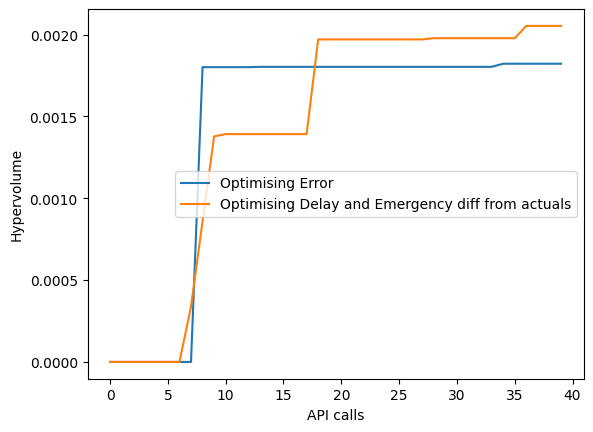

In [77]:
fig, ax = plt.subplots()

ax.plot([*range(len(so_hypervolume_trace))], so_hypervolume_trace, label='Optimising Error')
ax.plot([*range(len(mo_hypervolume_trace))], mo_hypervolume_trace, label='Optimising Delay and Emergency diff from actuals')

plt.xlabel("API calls")
plt.ylabel("Hypervolume")
plt.legend()

plt.show()

In [83]:
from ax.plot.pareto_frontier import plot_multiple_pareto_frontiers

In [80]:
mo_frontier = compute_posterior_pareto_frontier(
    experiment=mo_client.experiment,
    data=mo_client.experiment.fetch_data(),
    primary_objective=mo_client.experiment.metrics['emergency_from_actual'],
    secondary_objective=mo_client.experiment.metrics['delays_from_actual'],
    absolute_metrics=list(mo_client.experiment.metrics.keys()),
    num_points=20,
)

In [81]:
so_frontier = compute_posterior_pareto_frontier(
    experiment=so_experiment_copy,
    data=so_experiment_copy.fetch_data(),
    primary_objective=so_experiment_copy.metrics['emergency_from_actual'],
    secondary_objective=so_experiment_copy.metrics['delays_from_actual'],
    absolute_metrics=list(so_experiment_copy.metrics.keys()),
    num_points=20,
)


In [87]:
render(plot_multiple_pareto_frontiers({'so': so_frontier, 'mo': mo_frontier}, CI_level=0.95))